# Assignment


You have already picked out the dataset you want to work with. 

----

# Question 
1. EDA, i want to see some insights, present it neatly. 
2. Make the best presentation possible.
3. Fit a Decision Tree Classifier.
4. I want to see your trainning accuracy, testing accuracy and your confusion matrix. 
5. That's all, nothing more ^_^

Best of luck !!

![](https://media.tenor.com/fNpgCzeyhwgAAAAC/best-of-luck-good-luck.gif)

# Importing libraries and data 

In [5]:
# Importing all the libraries here
import pandas as pd
from pandas import to_datetime
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly import __version__
import plotly.express as px
init_notebook_mode(connected=True)
import plotly.graph_objects as go
%matplotlib inline
from sklearn.metrics import accuracy_score
import statsmodels.api as sm
from wordcloud import WordCloud
from sklearn.metrics import confusion_matrix
import random 
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.linear_model import LinearRegression
import math

In [6]:
# Below is a list of palletes stored in a variable palette_values. It will be used to visualize the plots we will be plotting below 
palette_values = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 
 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 
 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 
 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 
 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r',
'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 
 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 
 'Wistia','Wistia_r','YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 
 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 
 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r',
 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r',
 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 
 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r',
 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 
 'inferno_r', 'magma', 'magma_r', 'mako', 'mako_r', 
 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r',
 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r',
 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r',
 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b',
 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'twilight',
 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']

In [7]:
df = pd.read_csv("Customer Churn Prediction.csv")

In [8]:
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [9]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

# Identifying NA values

In [10]:
df.isna().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

###### There are no NA values in the dataset, so let's proceed to the Descriptive Statistics of the dataset.

## Descriptive Statistics

In [11]:
df.describe()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000,4250.000000
mean,100.236235,7.631765,180.259600,99.907294,30.644682,200.173906,100.176471,17.015012,200.527882,99.839529,9.023892,10.256071,4.426353,2.769654,1.559059
std,39.698401,13.439882,54.012373,19.850817,9.182096,50.249518,19.908591,4.271212,50.353548,20.093220,2.265922,2.760102,2.463069,0.745204,1.311434
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,0.000000,143.325000,87.000000,24.365000,165.925000,87.000000,14.102500,167.225000,86.000000,7.522500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,0.000000,180.450000,100.000000,30.680000,200.700000,100.000000,17.060000,200.450000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,16.000000,216.200000,113.000000,36.750000,233.775000,114.000000,19.867500,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.000000,52.000000,351.500000,165.000000,59.760000,359.300000,170.000000,30.540000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


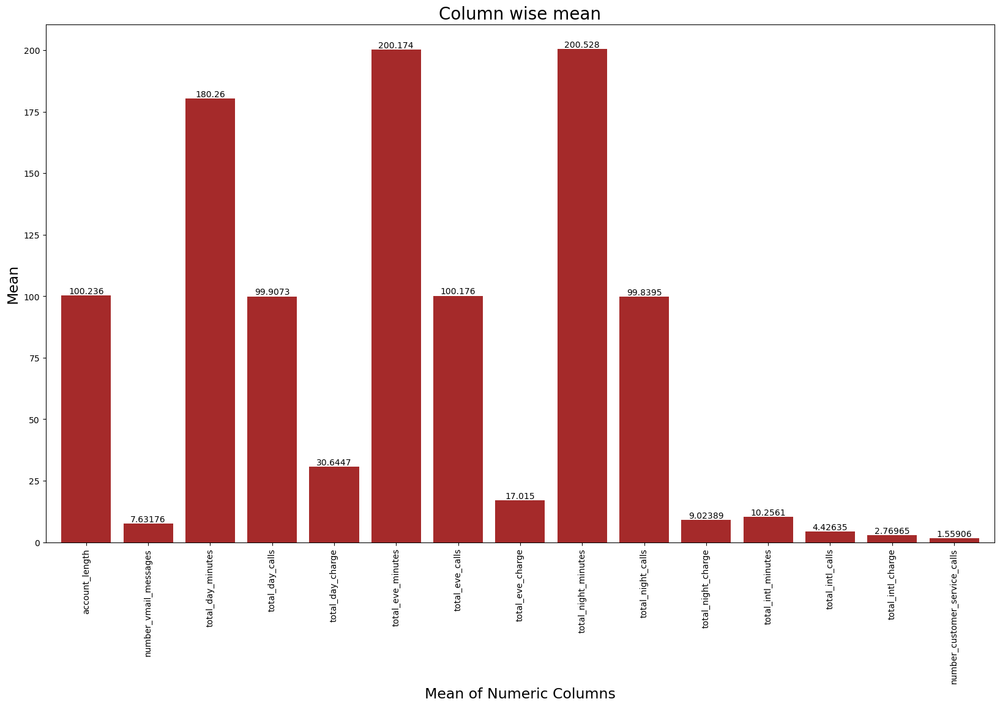

In [17]:
# Plotting the mean of numeric columns for better visualization 
plt.figure(figsize = (20, 11))
ax = df.describe().loc["mean"].plot.bar(color ='brown',width = 0.8)
ax.set_xlabel(xlabel = 'Mean of Numeric Columns', fontsize = 17)
ax.set_ylabel(ylabel = 'Mean', fontsize = 17)
ax.set_title(label = 'Column wise mean', fontsize = 20)
for i in ax.containers:
    ax.bar_label(i)

### Creating a new column "acc_len_range" for much better analysis. It will make a range out of the column "Area" as follows:
- "account_length" is from 0 to 00 it will come under acc_len_range 1
-  "account_length" is from 100 to 200 it will come under acc_len_range 2
-  "account_length" is from 200 to 245t will come under acc_len_range 3

In [30]:
def acc_len_range(i):
    if i["account_length"]<= 100:
        return int(1)
    elif 100 < i["account_length"] <= 200:
        return int(2)
    elif 200 < i["account_length"] <= 245 :
        return int(3)

### Applying the function to the Dataframe

In [32]:
df["acc_len_range"] = df.apply(acc_len_range, axis = 1)

In [33]:
df

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,acc_len_range
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,16.62,254.4,103,11.45,13.7,3,3.70,1,no,2
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,10.30,162.6,104,7.32,12.2,5,3.29,0,no,2
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,5.26,196.9,89,8.86,6.6,7,1.78,2,no,1
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,12.61,186.9,121,8.41,10.1,3,2.73,3,no,1
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,...,29.62,212.6,118,9.57,7.5,7,2.03,3,no,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,MT,83,area_code_415,no,no,0,188.3,70,32.01,243.8,...,20.72,213.7,79,9.62,10.3,6,2.78,0,no,1
4246,WV,73,area_code_408,no,no,0,177.9,89,30.24,131.2,...,11.15,186.2,89,8.38,11.5,6,3.11,3,no,1
4247,NC,75,area_code_408,no,no,0,170.7,101,29.02,193.1,...,16.41,129.1,104,5.81,6.9,7,1.86,1,no,1
4248,HI,50,area_code_408,no,yes,40,235.7,127,40.07,223.0,...,18.96,297.5,116,13.39,9.9,5,2.67,2,no,1


##### Let's proceed to EDA.

# Exploratory Data Analysis

![](https://th.bing.com/th/id/R.2eeddeb15e6fe02a53ea8091ba912849?rik=z9q1vV3j31oYWw&pid=ImgRaw&r=0)

In [34]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'acc_len_range'],
      dtype='object')

## Amount of churned customers

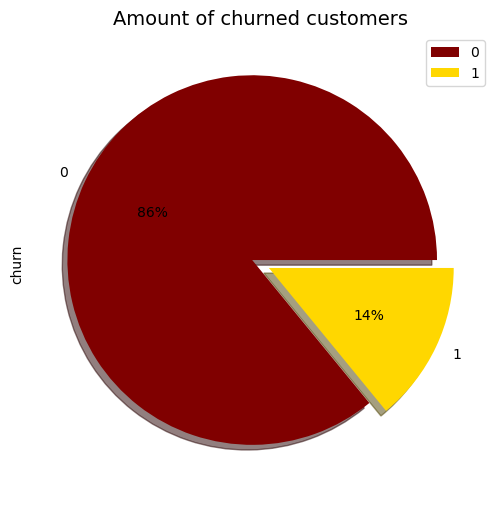

In [269]:
plt.figure(figsize= (6,6))
colors = ['maroon', 'gold']
explode = (0.05, 0.05)
df['churn'].value_counts().plot(kind ='pie', autopct='%1.0f%%', colors=colors, explode=explode, shadow=True)
plt.legend()
plt.title("Amount of churned customers", fontsize=14)
plt.show()

Overall, Company is performing well because only 14% of the customers have churned.

## Customer optiong for voice mail plan

Text(0.5, 1.0, 'Customers opting for Voice Mail Plan')

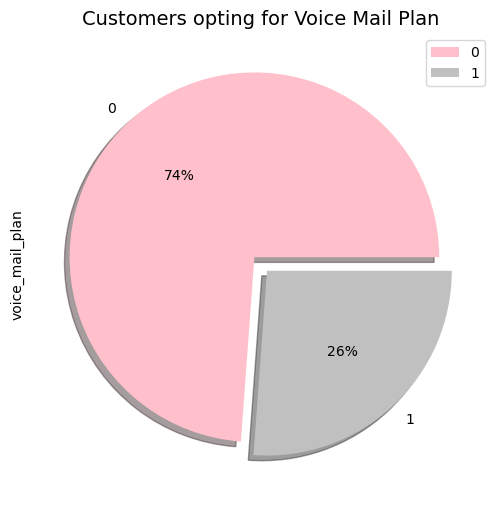

In [271]:
plt.figure(figsize= (6,6))
colors = ['pink', 'silver']
explode = (0.05, 0.05)
df['voice_mail_plan'].value_counts().plot(kind ='pie', autopct='%1.0f%%', colors=colors, explode=explode, shadow=True)
plt.legend()
plt.title("Customers opting for Voice Mail Plan", fontsize=14)

* People who opt for voice mail plans feel the urgency to convey their message and are in hurry because they prefer speaking over texting. 
* 74% of our customers don’t feel the emergency to communicate and hence voice mails adds up to 26% of the revenue. 

## Customers opting for International Plan

Text(0.5, 1.0, 'Customers opting for International Plan')

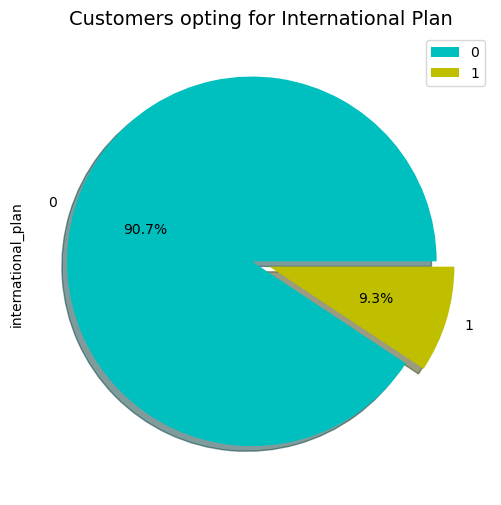

In [275]:
plt.figure(figsize= (6,6))
colors = ['c', 'y']
explode = (0.05, 0.05)
df['international_plan'].value_counts().plot(kind ='pie', autopct='%1.1f%%', colors=colors, explode=explode, shadow=True)
plt.legend()
plt.title("Customers opting for International Plan", fontsize=14)

* People who opt for international plans have their friends/family/relatives in foreign countries. 
* Therefore 9.3% of our customers have international contacts list.

## Account length grouped by International Plan Enrollment

Text(0.5, 1.0, 'Account length grouped by International Plan Enrollment')

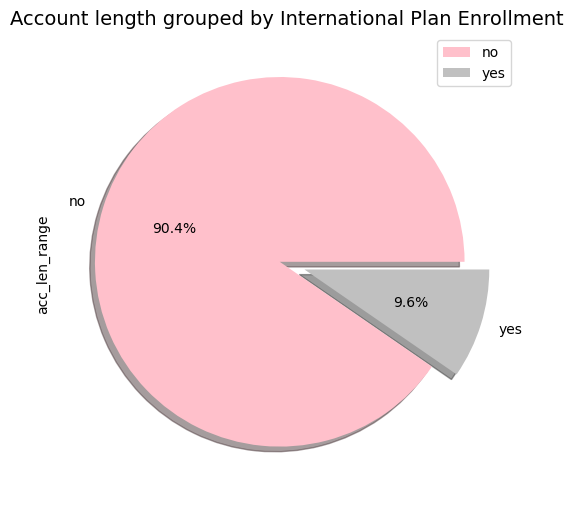

In [53]:
plt.figure(figsize= (6,6))
colors = ['pink', 'silver']
explode = (0.04, 0.1)
df.groupby(by = 'international_plan').sum()['acc_len_range'].plot(kind ='pie', autopct='%1.1f%%', colors=colors, explode=explode, shadow=True)
plt.legend()
plt.title("Account length grouped by International Plan Enrollment", fontsize=14)

People who have opted for the international plan have a significantly higher proportion of the number of months with the current telco provider.

## Account length grouped by Voice Mail Plan Enrollment

Text(0.5, 1.0, 'Account length grouped by Voice Mail Plan Enrollment')

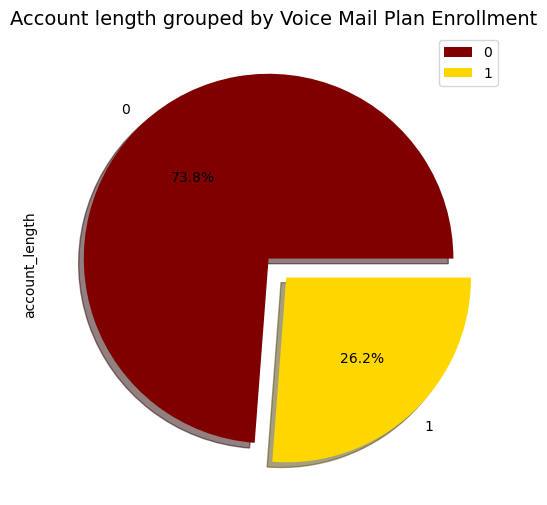

In [276]:
plt.figure(figsize= (6,6))
colors = ['maroon', 'gold']
explode = (0.04, 0.1)
df.groupby(by = 'voice_mail_plan').sum()['account_length'].plot(kind ='pie', autopct='%1.1f%%', colors=colors, explode=explode, shadow=True)
plt.legend()
plt.title("Account length grouped by Voice Mail Plan Enrollment", fontsize=14)

It could be seen that people who have not opted for the voice mail plan have been there with the current telco provider for more number of months.

## Area-wise count of customers

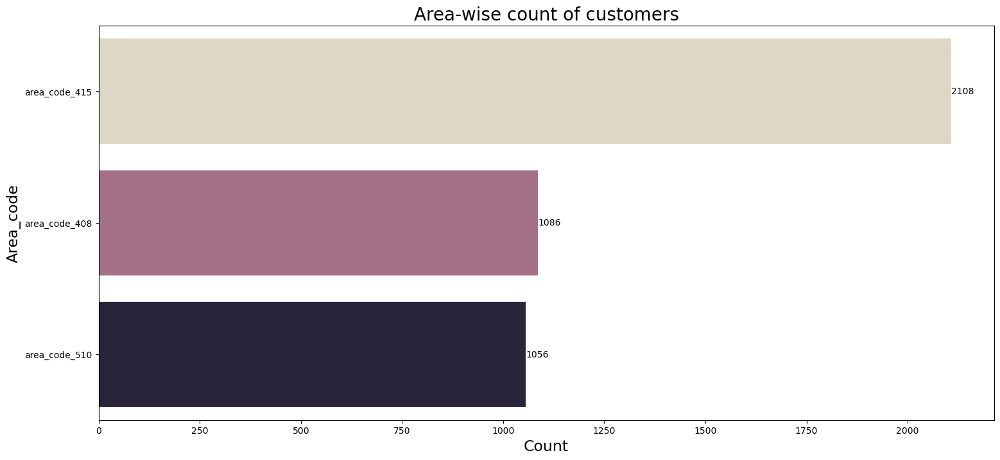

In [68]:
plt.figure(figsize = (18, 8))
ax = sns.countplot(y ='area_code', data = df, palette='ch:s=-.2,r=.6')
ax.set_xlabel(xlabel = 'Count', fontsize = 17)
ax.set_ylabel(ylabel = 'Area_code', fontsize = 17)
ax.set_title(label = 'Area-wise count of customers', fontsize = 20) 
for i in ax.containers:
    ax.bar_label(i)

* We can see that area_code_415 has the majority of the customers, i.e almost double of the customers from area_code_408 and area_ode_510.
* Also, there is approxiamately same number of customers from area_code_408 and area_code_510. So, the company should increase its facilities in these areas to cater more number of customers.

## Count of number of Customer Service Calls

In [10]:
Customer_service_calls = df['number_customer_service_calls'].value_counts().head(10)

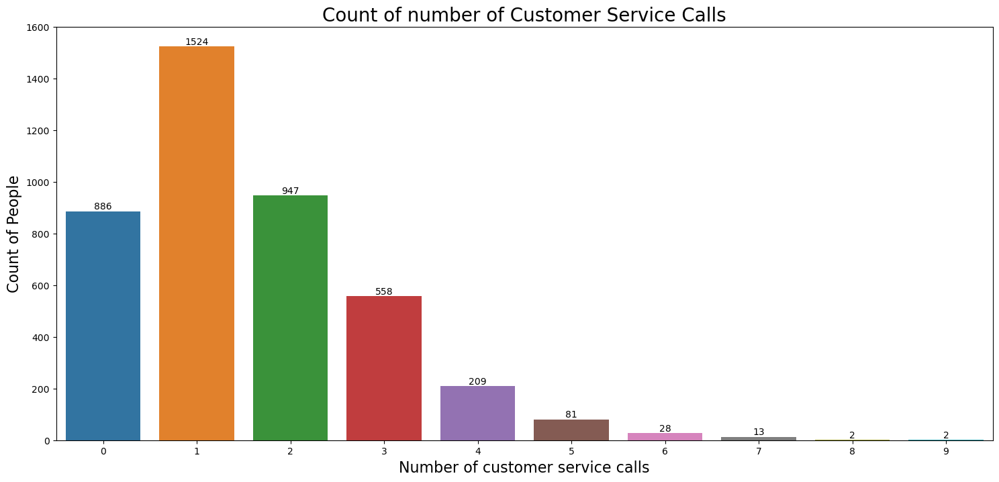

In [70]:
plt.figure(figsize = (18, 8))
ax = sns.countplot(x ='number_customer_service_calls', data = df)
ax.set_xlabel(xlabel = 'Number of customer service calls', fontsize = 16)
ax.set_ylabel(ylabel = 'Count of People', fontsize = 16)
ax.set_title(label = 'Count of number of Customer Service Calls', fontsize = 20)
for i in ax.containers:
    ax.bar_label(i)

* People’s expectations from customers service gets majorly broken if they don’t pick for the first time it self. 
* Generally people only call customer care for upto 3 times while some who may have serious issues call upto 5 times.
* Only outliers call for 6,7, or maximum 8 times.

## State-wise count of customers

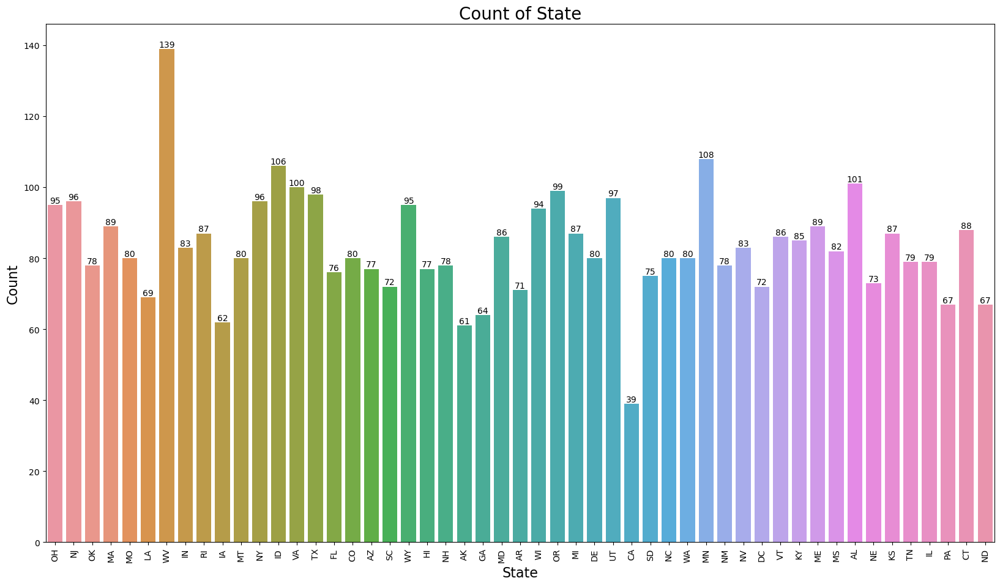

In [67]:
plt.figure(figsize = (20, 11))
ax = sns.countplot(x ='state', data = df)
ax.set_xlabel(xlabel = 'State', fontsize = 16)
ax.set_ylabel(ylabel = 'Count', fontsize = 16)
ax.set_title(label = 'Count of State', fontsize = 20)
plt.xticks(rotation=90)
for i in ax.containers:
    ax.bar_label(i)

* We can infer that the majority of the customers availing the telcom services from our company are from WV state.
* The company should increase the telcom benefits in the CA state as it has the least customers from this state.

## Count of International Plan differentiated by churned customers

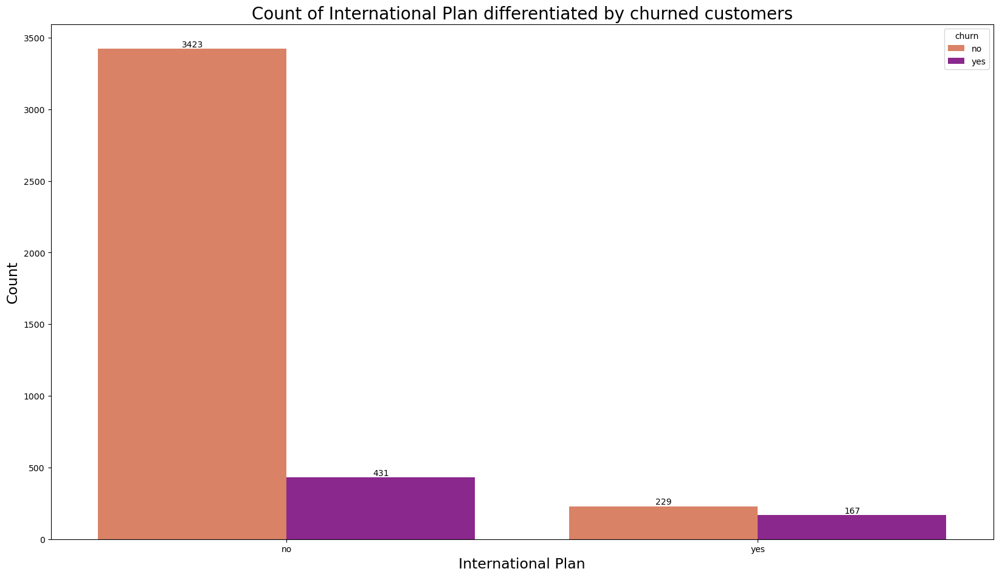

In [72]:
plt.figure(figsize = (20, 11))
ax = sns.countplot(x ='international_plan', data = df,hue="churn", palette= random.choice(palette_values))
ax.set_xlabel(xlabel = 'International Plan', fontsize = 17)
ax.set_ylabel(ylabel = 'Count', fontsize = 17)
ax.set_title(label = 'Count of International Plan differentiated by churned customers', fontsize = 20) 
for i in ax.containers:
    ax.bar_label(i)

* There are more number of people who have not opted for international plan and not churned.
* From the people who opted international plan, majority of the customers have churned. This directly states that the company should work better on its international plan services to retain more customers.

## Count of Voice Mail Plan differentiated by churned customers

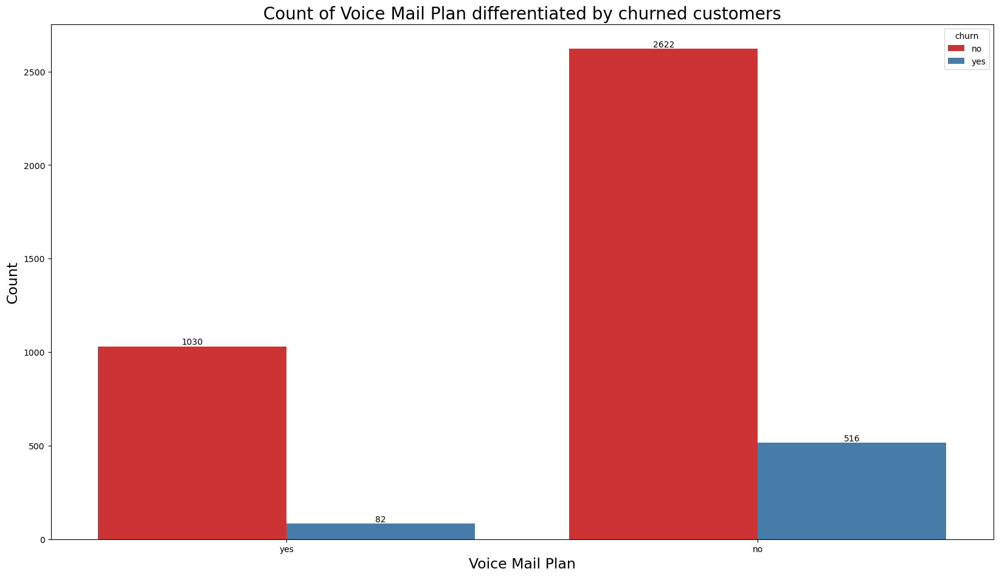

In [73]:
plt.figure(figsize = (20, 11))
ax = sns.countplot(x ='voice_mail_plan',hue="churn", data = df, palette= random.choice(palette_values))
ax.set_xlabel(xlabel = 'Voice Mail Plan', fontsize = 17)
ax.set_ylabel(ylabel = 'Count', fontsize = 17)
ax.set_title(label = 'Count of Voice Mail Plan differentiated by churned customers', fontsize = 20) 
for i in ax.containers:
    ax.bar_label(i)

* Majority of the customers have not opted for voice mail plan.
* From the customers who have opted for the plan, only very few customers have churned. This states that the company is doing well in terms of retaining the customers in the voice mail plan. But it should provide some discounts or something on this facility to attract more customers.

## Count of number of customer service calls differentiated by Churned customers

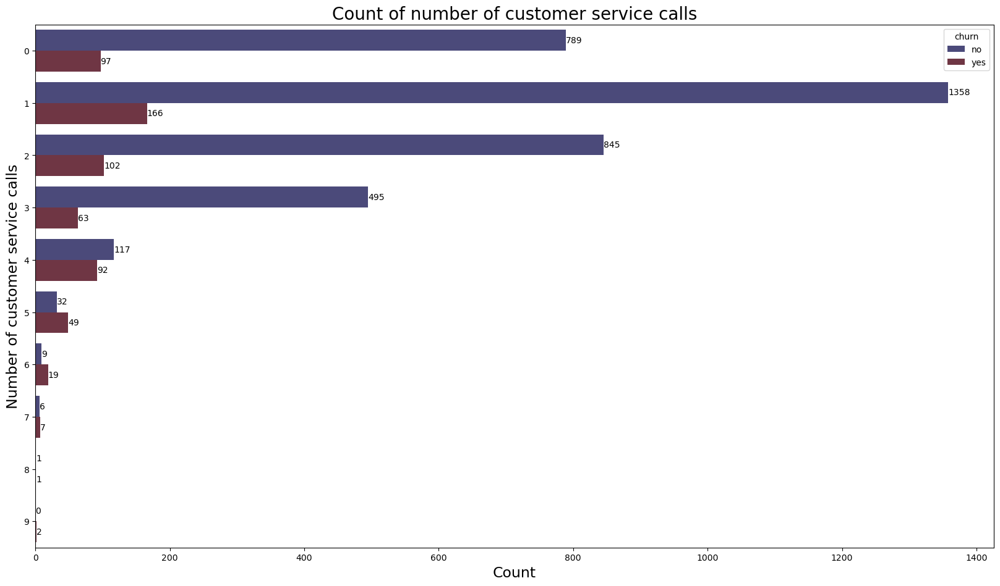

In [82]:
plt.figure(figsize = (20, 11))
ax = sns.countplot(y ='number_customer_service_calls',hue="churn", data = df, palette='icefire')
ax.set_ylabel(ylabel = 'Number of customer service calls', fontsize = 17)
ax.set_xlabel(xlabel = 'Count', fontsize = 17)
ax.set_title(label = 'Count of number of customer service calls', fontsize = 20) 
for i in ax.containers:
    ax.bar_label(i)

* We can infer that majority of the customers contact the customer service only once and also most of them have been retained in the company. So, we can say that the customer service is doing a good job in attending the newly contacting customers.
* On the other hand, the quality of customer service is somewhat degrading after they receive 5 or more calls as after that, majority of the customers have been churned.

## Relationship between Total day charge and Total night charge

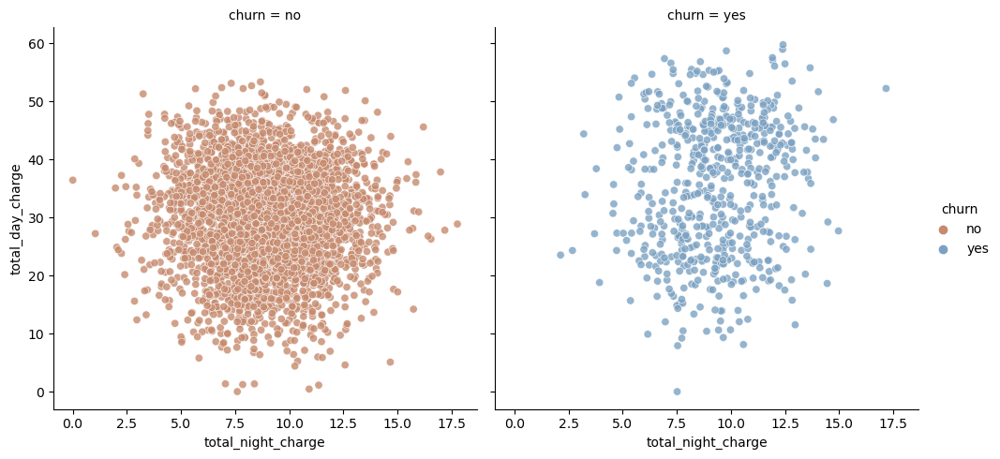

In [104]:
ax = sns.relplot(y="total_day_charge" , x="total_night_charge" ,data=df, alpha=0.8, col="churn", hue="churn", palette= random.choice(palette_values))
plt.show()

* Firstly, we can see that there is no correlation between total day charge and total night charge.
* Secondly, we can infer from the above plot that there are less customers who were paying the day and night charge and also churned from the company.

## Total night charges by churn

C:\Users\aditi\AppData\Local\Temp\ipykernel_27664\1901332447.py:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\aditi\AppData\Local\Temp\ipykernel_27664\1901332447.py:2: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




Text(0.5, 1.0, 'Total night charges by churn')

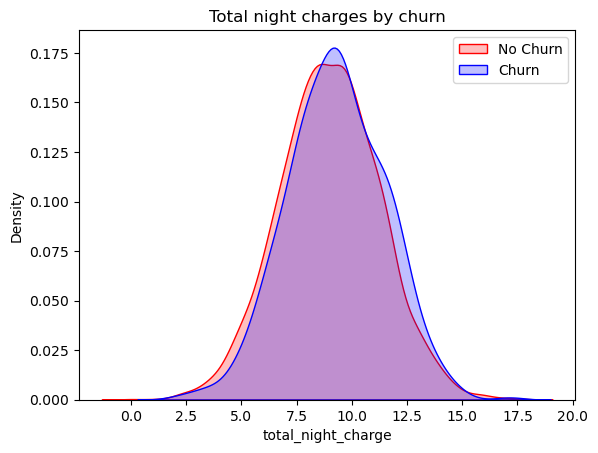

In [111]:
ax = sns.kdeplot(df['total_night_charge'][df['churn']=='no'],color="Red" , shade = True)
ax = sns.kdeplot(df['total_night_charge'][df['churn']=='yes'], color="Blue", shade = True)
ax.legend(["No Churn","Churn"])
ax.set_title('Total night charges by churn')

Churning of the customers is high when the night charges are between 7.5-10.

## Total day charges by churn

C:\Users\aditi\AppData\Local\Temp\ipykernel_27664\3807853222.py:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\aditi\AppData\Local\Temp\ipykernel_27664\3807853222.py:2: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




Text(0.5, 1.0, 'Total day charges by churn')

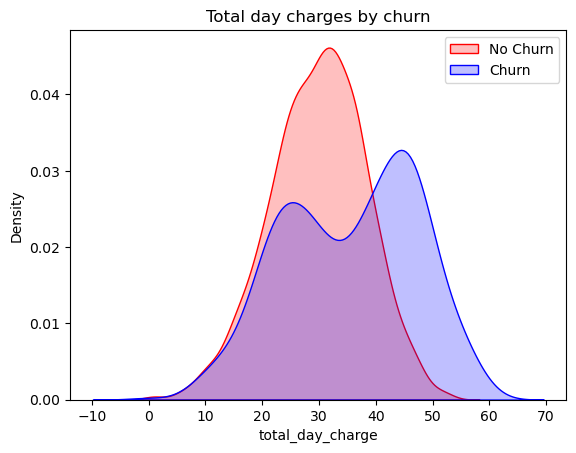

In [112]:
ax = sns.kdeplot(df['total_day_charge'][df['churn']=='no'],color="Red" , shade = True)
ax = sns.kdeplot(df['total_day_charge'][df['churn']=='yes'], color="Blue", shade = True)
ax.legend(["No Churn","Churn"])
ax.set_title('Total day charges by churn')

Churning of the customers is high as total day charges increase.

## Total Evening charges by churn

C:\Users\aditi\AppData\Local\Temp\ipykernel_27664\446176227.py:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


C:\Users\aditi\AppData\Local\Temp\ipykernel_27664\446176227.py:2: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




Text(0.5, 1.0, 'Total Evening charges by churn')

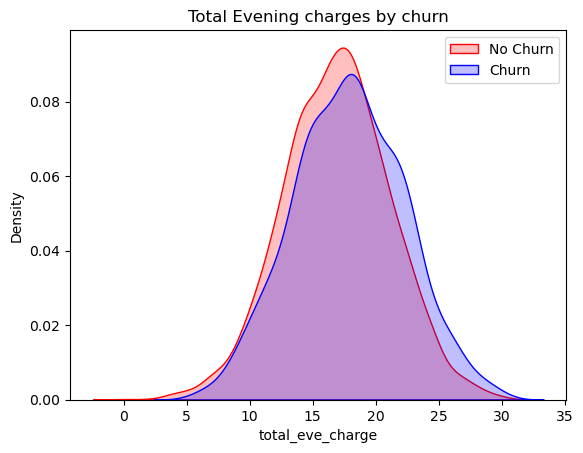

In [115]:
ax = sns.kdeplot(df['total_eve_charge'][df['churn']=='no'],color="Red" , shade = True)
ax = sns.kdeplot(df['total_eve_charge'][df['churn']=='yes'], color="Blue", shade = True)
ax.legend(["No Churn","Churn"])
ax.set_title('Total Evening charges by churn')

Churning of the customers is high when the total evening charges are between 15-20.

## Area-wise number of Day Calls

Text(0.5, 1.0, 'Area-wise number of Day Calls')

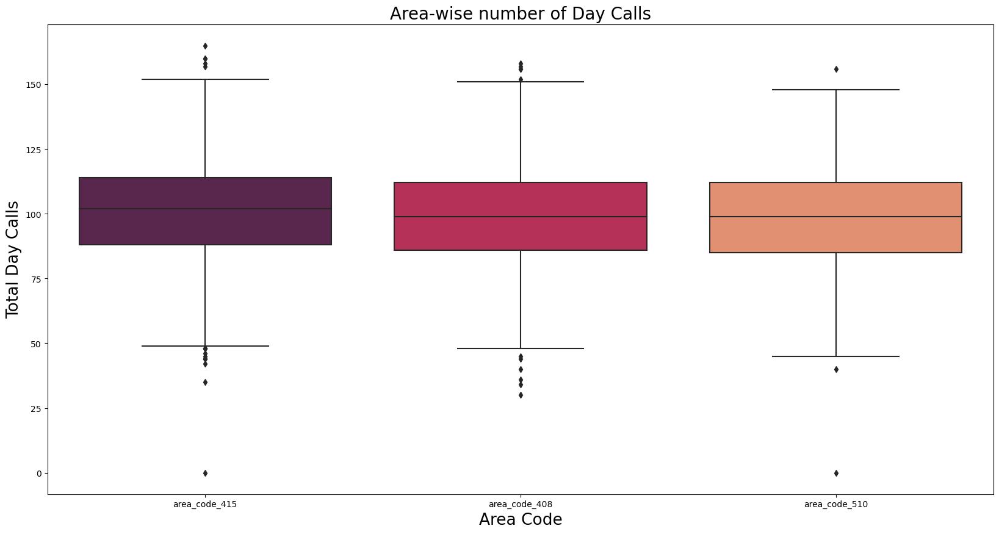

In [121]:
plt.figure(figsize = (20,10))
ax = sns.boxplot(x="area_code", y = "total_day_calls" ,data =df, palette="rocket")
ax.set_xlabel(xlabel = 'Area Code', fontsize = 19)
ax.set_ylabel(ylabel = 'Total Day Calls', fontsize = 19)
plt.title('Area-wise number of Day Calls', fontsize = 20)

* Most of the number of day calls range between 50-150.
* Area_code_510 has the least outliers in the total number of day calls.

## Churn and Total International Charge

Text(0.5, 1.0, 'Churn and Total International Charge')

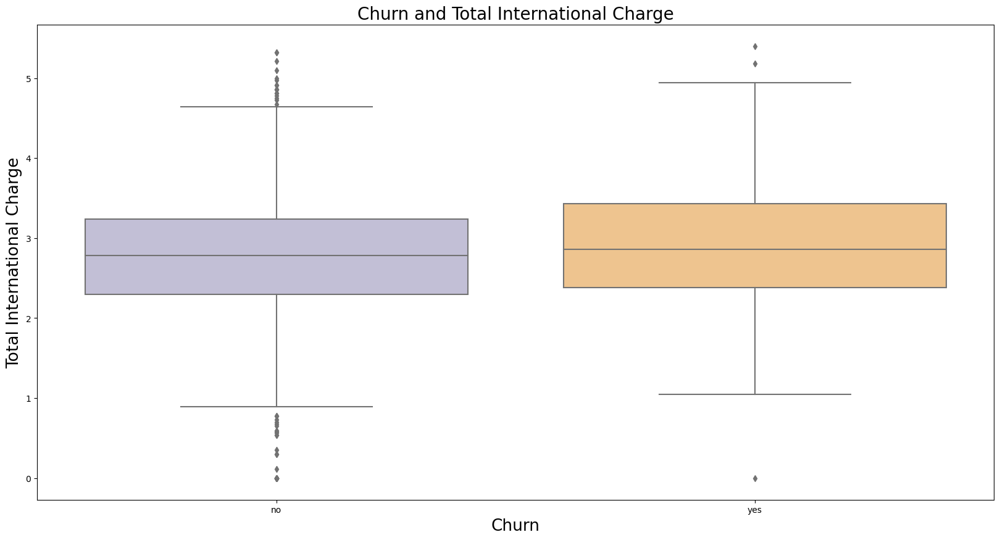

In [128]:
plt.figure(figsize = (20,10))
ax = sns.boxplot(x="churn", y = "total_intl_charge" ,data =df, palette= random.choice(palette_values))
ax.set_xlabel(xlabel = 'Churn', fontsize = 19)
ax.set_ylabel(ylabel = 'Total International Charge', fontsize = 19)
plt.title('Churn and Total International Charge', fontsize = 20)

* There are many outliers in the total international charge for the customers who have not been churned. They have been retained with the company even at the higher international charges.
* So, there is an opportunity for the company that it can increase its international charge per call to increase its revenue.

## Total night calls categorized by international plan

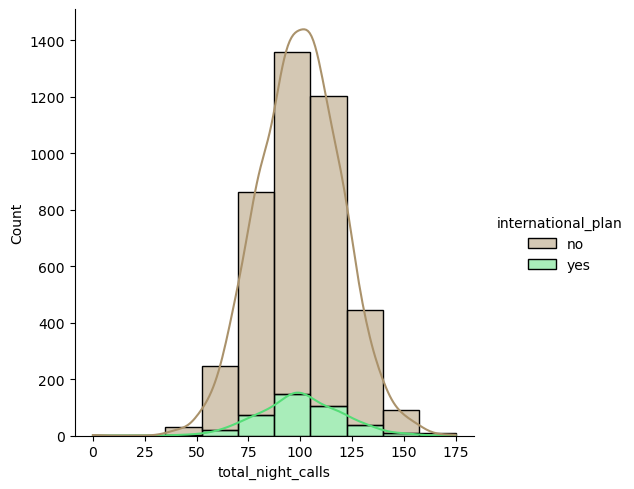

In [15]:
ax = sns.displot(df, x="total_night_calls", hue="international_plan",multiple='stack', bins=10, palette='terrain_r', kde='True')

* Total night calls distribution is normally distributed.
* Also, majority of the people who are doing night calls do not have an international plan. 

## Comparison of Number of customer service calls distribution vs Customer Churn

Text(0.5, 1.0, 'Churn and Number of customer service calls')

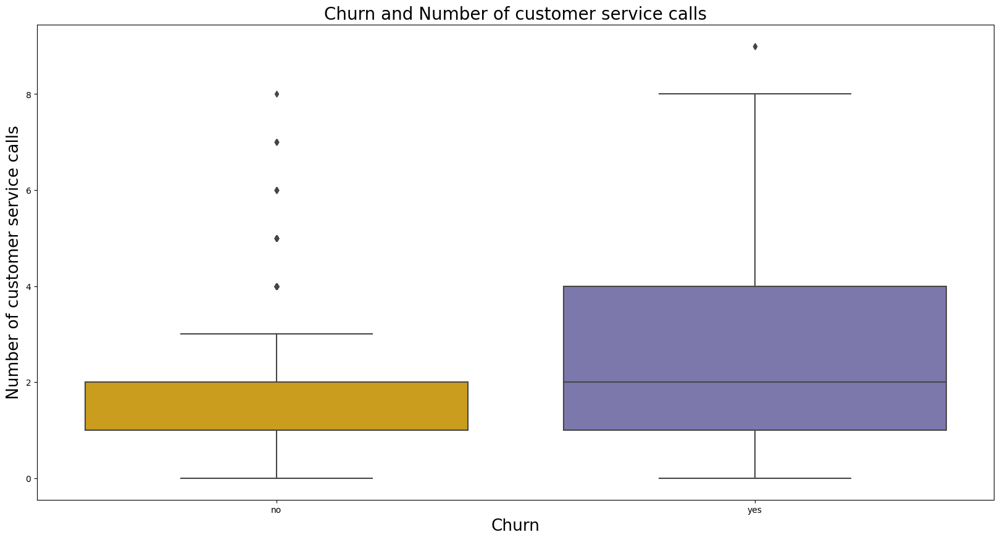

In [132]:
plt.figure(figsize = (20,10))
ax = sns.boxplot(x="churn", y = "number_customer_service_calls" ,data =df, palette= random.choice(palette_values))
ax.set_xlabel(xlabel = 'Churn', fontsize = 19)
ax.set_ylabel(ylabel = 'Number of customer service calls', fontsize = 19)
plt.title('Churn and Number of customer service calls', fontsize = 20)

* Customer service receives more calls for complaints than inquiries.
* This is because people who are regular customers don’t feel the need to ask for service or any help.

## Relationship between number of night calls and night charge

In [133]:
fig = px.scatter(df, x="total_night_calls", y="total_night_charge", color='international_plan', hover_data = ["total_night_charge"], title='Relationship between number of night calls and Night Charge')
fig.show()

* Average calls per month is 100 and average charge is ₹10. So this plan generally generates ₹1000 per month.
* Outliers are more on the right side which means that at least 40 calls will be made with this plan.

## Relationship between number of evening calls and Evening charge

In [134]:
fig = px.scatter(df, x="total_eve_calls", y="total_eve_charge",color='number_customer_service_calls',hover_data = ["total_eve_charge"], title='Relationship between number of evening calls and Evening Charge')
fig.show()

* Average calls per moth is 100 and average charge is ₹20. So this plan generally generates ₹2000 per month.
* Minimum calls are 50.

## Account length of customers based upon Churn status

Text(0.5, 1.0, 'Account length of customers based upon Churn status')

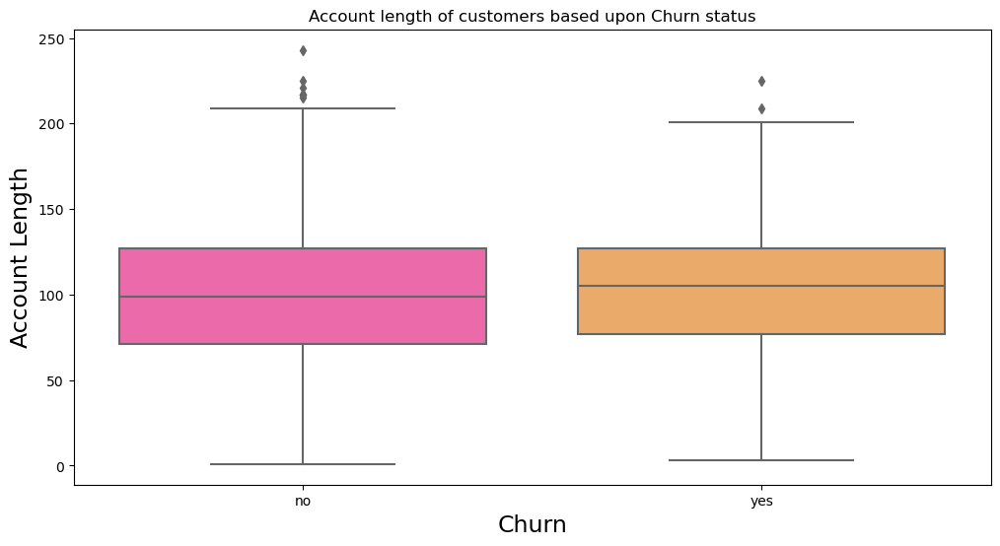

In [135]:
churn = df['churn'].value_counts().head(5)
churn_index = churn.index
df_churn_accountlength = df.loc[df['churn'].isin(churn_index)& df['account_length']]
plt.figure(1 , figsize = (12,6))
ax = sns.boxplot(x = 'churn' , y = 'account_length' , data = df_churn_accountlength, palette='spring')
ax.set_xlabel(xlabel = 'Churn', fontsize = 17)
ax.set_ylabel(ylabel = 'Account Length', fontsize = 17)
plt.title('Account length of customers based upon Churn status')

* People stayed for maximum 200 months with the provider.
* Company stops giving value addition to customers after average of 100 months.

## Total International Charge by the Account length range

<Axes: xlabel='total_intl_charge'>

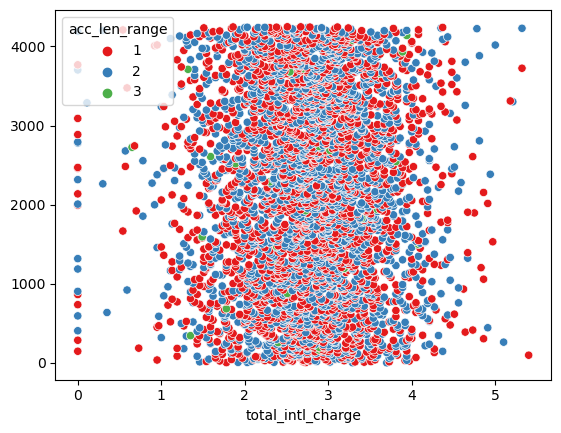

In [158]:
sns.scatterplot(x='total_intl_charge', y=np.arange(df.shape[0]), data=df,hue="acc_len_range", palette='Set1')

* In the above scatterplot we can see the distribution of total international charge by their Account length range.
* Mostly, the values are evenly spread out in the range of 1.5 to 4.
* It also depicts that there are very less number of customers who have retained with the company for more than 200 months and paying for international calling.

## Number of voice mail messages w.r.t Account length range

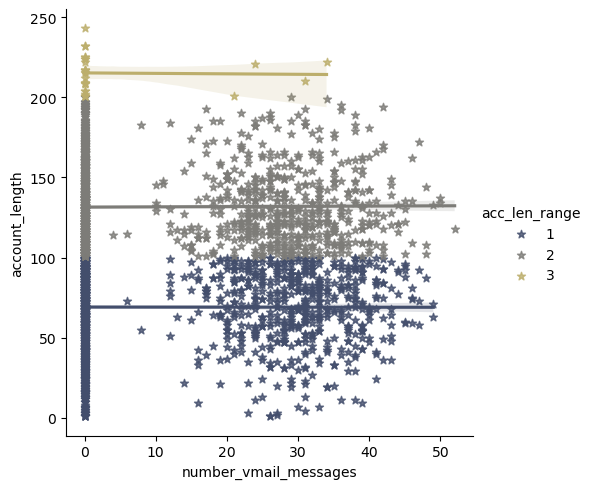

In [161]:
sns.lmplot(x='number_vmail_messages', y='account_length', data=df, markers="*", hue="acc_len_range", palette="cividis")

* There is no relationship between the number of voice mail messages and the account length range.
* We can see very few customers falling in the account length range 3 i.e more than 200 months.
* Most of the voice mail messages fall between 20-40.

## Pairplot 

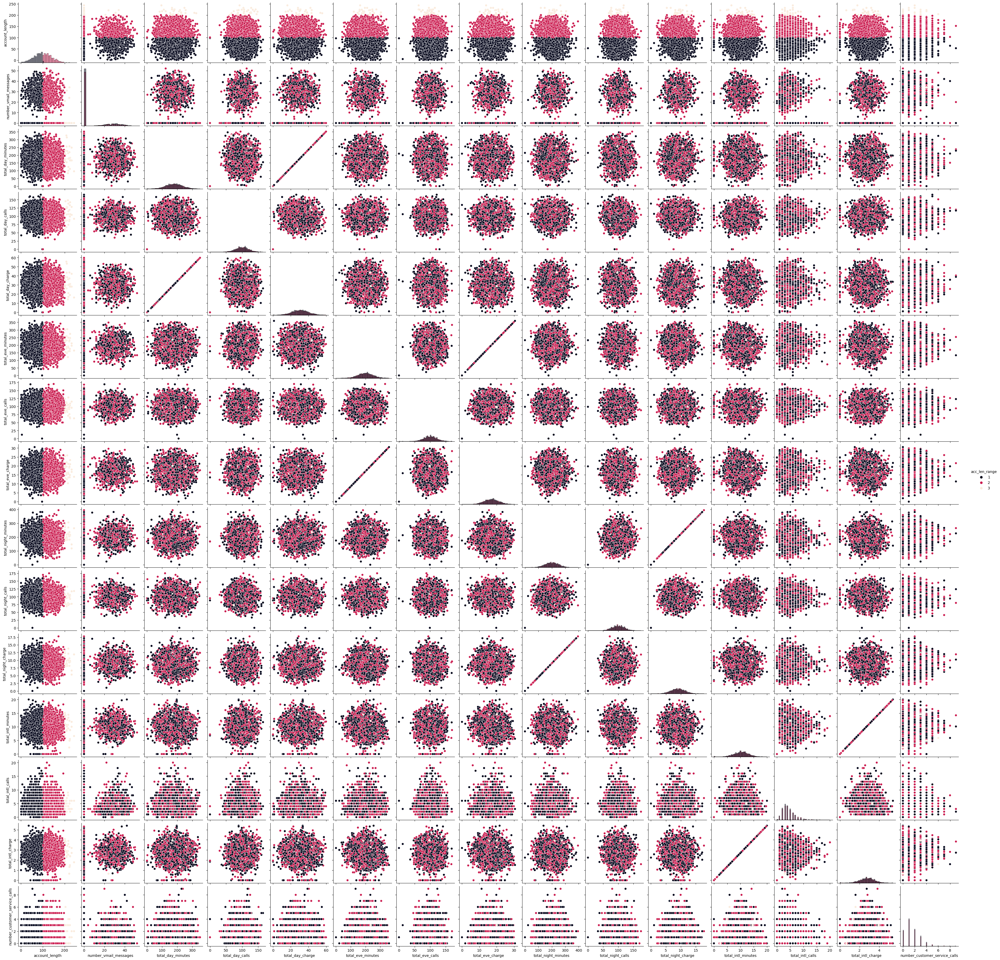

In [177]:
sns.pairplot(df,diag_kind="hist", hue="acc_len_range", palette="rocket")

We can see that there is a positive correlation between the following, which is quite obvious:
  * Total night charge and total night minutes
  * Total day charge and total day minutes
  * Total evening charge and evening night minutes
  * Total international charge and total international minutes

### Checking data types

In [179]:
df.dtypes

state                             object
account_length                     int64
area_code                         object
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
acc_len_range                      int64
dtype: object

### Storing all the Catagorical columns in a variable.

In [180]:
df_categorical = df.select_dtypes(include = "object")

In [181]:
df_categorical.head(1)

,state,area_code,international_plan,voice_mail_plan,churn
0,OH,area_code_415,no,yes,no


### Dropping the State column, as it have been considered as a categorical column.

In [185]:
df_categorical.drop(['state'], axis = 1, inplace = True)

C:\Users\aditi\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Storing all the Numerical columns in a variable.

In [182]:
df_numerical = df.select_dtypes(exclude = "object")

In [184]:
df_numerical.head(1)

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,acc_len_range
0,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,2


### Making a dummy DataFrame for the correlation, as we can't see the coorelation between the variable without converting the data into dummy data.

In [186]:
df_dummy = pd.get_dummies(df_categorical, drop_first = True)

In [187]:
df_final = pd.concat([df_dummy, df_numerical], axis = 1)

#### This is our final dummy dataset.

In [188]:
df_final

,area_code_area_code_415,area_code_area_code_510,international_plan_yes,voice_mail_plan_yes,churn_yes,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,acc_len_range
0,1,0,0,1,0,107,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,2
1,1,0,0,0,0,137,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,2
2,0,0,1,0,0,84,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,1
3,1,0,1,0,0,75,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,1
4,0,1,0,1,0,121,24,218.2,88,37.09,...,108,29.62,212.6,118,9.57,7.5,7,2.03,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,1,0,0,0,0,83,0,188.3,70,32.01,...,88,20.72,213.7,79,9.62,10.3,6,2.78,0,1
4246,0,0,0,0,0,73,0,177.9,89,30.24,...,82,11.15,186.2,89,8.38,11.5,6,3.11,3,1
4247,0,0,0,0,0,75,0,170.7,101,29.02,...,126,16.41,129.1,104,5.81,6.9,7,1.86,1,1
4248,0,0,0,1,0,50,40,235.7,127,40.07,...,126,18.96,297.5,116,13.39,9.9,5,2.67,2,1


## Correlation

<Axes: >

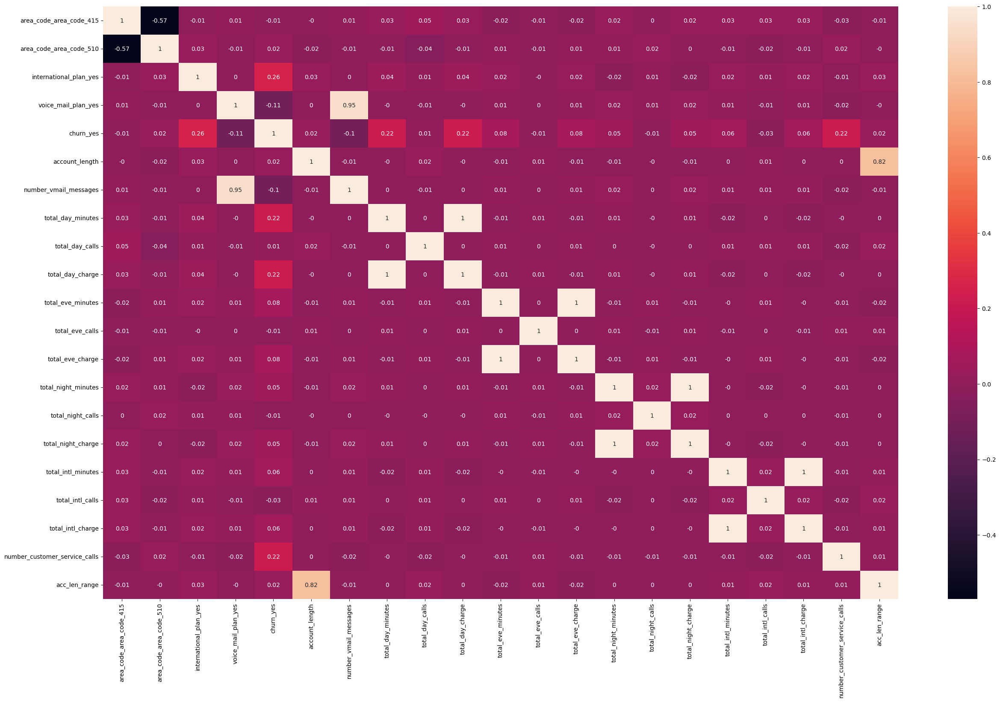

In [189]:
plt.figure(figsize = (30, 18))
sns.heatmap(np.round(df_final.corr(),2),annot=True)

## Wordcloud

In [196]:
text = ' '.join(df['state'])

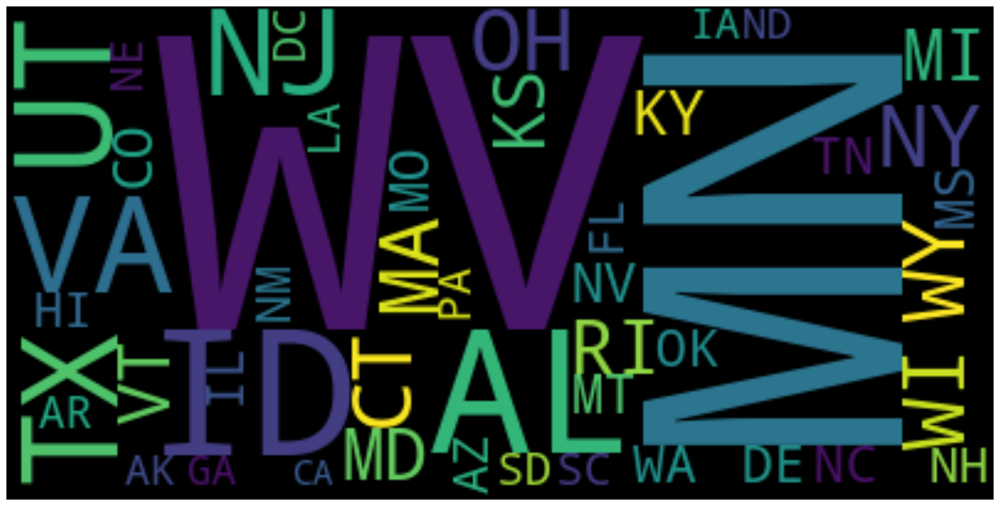

In [197]:
text = " ".join(n for n in df['state'])
wc =  WordCloud(background_color='black').generate(text)
plt.figure(figsize=(20,10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

From this wordcloud, we can easily see that most of the customers belong to WV state, followed by the MN state.

# ---------------------------------------------------------------------------------------------------------------

# Decision Tree Modelling

### Encoding categorical columns into numerical columns

In [198]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

In [224]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'acc_len_range'],
      dtype='object')

In [225]:
col = ['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn']

In [226]:
for i in col:
    df[i] = le.fit_transform(df[i])

### Dropping the 'state' column

In [227]:
df = df.drop('state', axis = 1)

### Splitting the data

In [228]:
x = df.drop('churn', axis= 1)
y = df['churn']

In [229]:
x_train,x_test,y_train,y_test=train_test_split(x,y, random_state=42, test_size=0.30)

In [230]:
x

,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,acc_len_range
0,106,1,0,1,20,737,86,737,832,64,740,1378,65,732,116,3,116,1,2
1,136,1,0,0,0,1483,77,1483,195,71,185,513,66,319,101,5,101,0,2
2,83,0,1,0,0,1788,34,1788,18,49,18,842,51,473,45,7,45,2,1
3,74,1,1,0,0,784,76,784,393,83,359,744,83,428,80,3,80,3,1
4,120,2,0,1,18,1261,51,1261,1768,69,1567,991,80,544,54,7,54,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,82,1,0,0,0,981,33,981,1293,49,1137,1002,41,549,82,6,82,0,1
4246,72,0,0,0,0,883,52,883,259,43,243,737,51,425,94,6,94,3,1
4247,74,0,0,0,0,821,64,821,810,87,720,235,66,173,48,7,48,1,1
4248,49,0,0,1,34,1418,90,1418,1099,87,969,1656,78,903,78,5,78,2,1


In [231]:
y

0       0
1       0
2       0
3       0
4       0
       ..
4245    0
4246    0
4247    0
4248    0
4249    0
Name: churn, Length: 4250, dtype: int32

## Plotting the decision tree

In [240]:
clf = DecisionTreeClassifier(min_samples_split=1000, max_depth=10)
clf = clf.fit(x_train, y_train)
clf

DecisionTreeClassifier(max_depth=10, min_samples_split=1000)

In [241]:
from sklearn import tree

[Text(0.8461538461538461, 0.9545454545454546, 'x[5] <= 1623.5\ngini = 0.234\nsamples = 2975\nvalue = [2572, 403]'),
 Text(0.7692307692307693, 0.8636363636363636, 'x[17] <= 3.5\ngini = 0.188\nsamples = 2790\nvalue = [2497, 293]'),
 Text(0.6923076923076923, 0.7727272727272727, 'x[2] <= 0.5\ngini = 0.133\nsamples = 2575\nvalue = [2390, 185]'),
 Text(0.6153846153846154, 0.6818181818181818, 'x[7] <= 1293.5\ngini = 0.091\nsamples = 2348\nvalue = [2236, 112]'),
 Text(0.5384615384615384, 0.5909090909090909, 'x[8] <= 1743.5\ngini = 0.045\nsamples = 1982\nvalue = [1936, 46]'),
 Text(0.46153846153846156, 0.5, 'x[0] <= 210.5\ngini = 0.043\nsamples = 1972\nvalue = [1929, 43]'),
 Text(0.38461538461538464, 0.4090909090909091, 'x[11] <= 1390.5\ngini = 0.042\nsamples = 1968\nvalue = [1926, 42]'),
 Text(0.3076923076923077, 0.3181818181818182, 'x[6] <= 91.5\ngini = 0.034\nsamples = 1720\nvalue = [1690, 30]'),
 Text(0.23076923076923078, 0.22727272727272727, 'x[10] <= 1461.5\ngini = 0.03\nsamples = 1601\nv

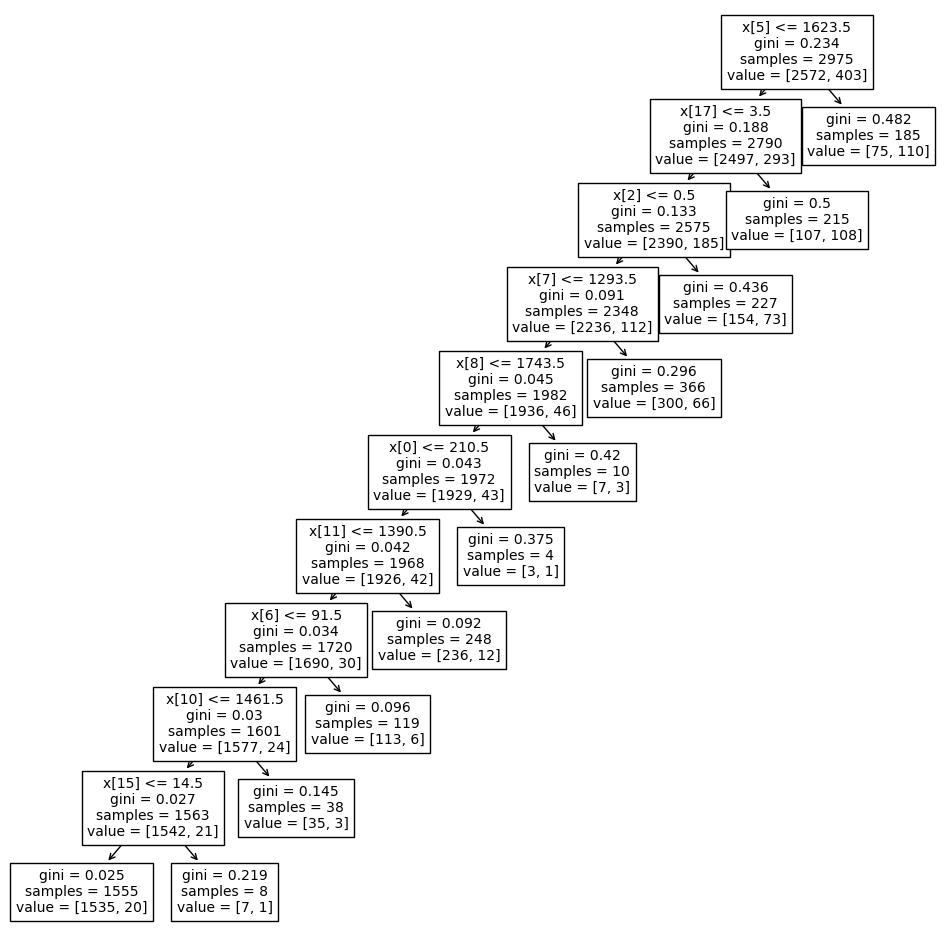

In [242]:
plt.figure(figsize=(12,12))
tree.plot_tree(clf, fontsize=10)

## Checking the training accuracy

In [243]:
from sklearn.metrics import accuracy_score

In [244]:
clf.predict(x_train)

array([0, 0, 0, ..., 1, 0, 0])

In [245]:
y_pred_train_clf = clf.predict(x_train)

In [254]:
acc_train = accuracy_score(y_train,y_pred_train_clf)

In [255]:
acc_train

0.8766386554621849

#### Training accuracy : 87.66%

## Plotting a confusion matrix for training predictions

In [249]:
cm = confusion_matrix(y_train,y_pred_train_clf)

Text(0.5, 1.0, 'Prediction')

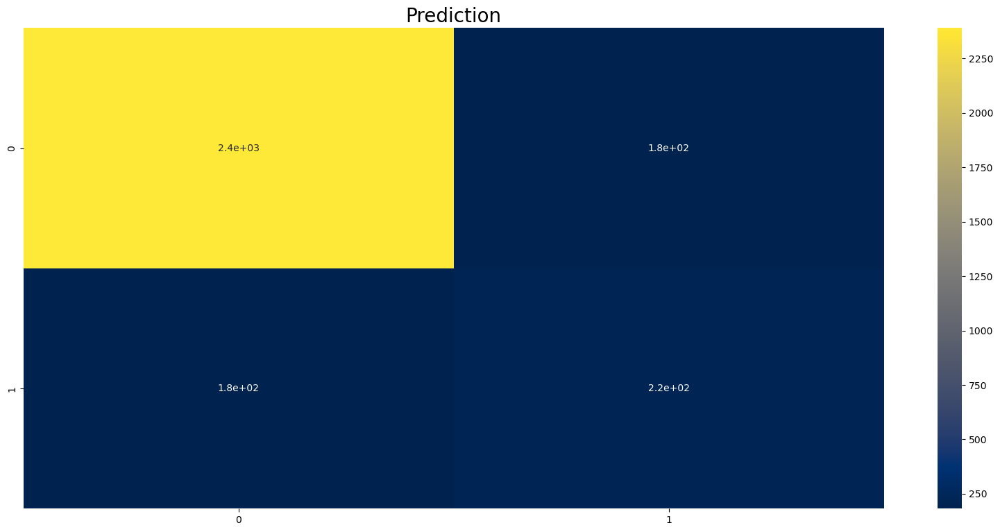

In [250]:
plt.figure(figsize = (20,9))
sns.heatmap(cm, annot=True, cmap="cividis")
plt.title('Prediction', fontsize=20)

## Checking the testing accuracy

In [251]:
y_pred_test_clf = clf.predict(x_test)

In [253]:
acc_test = accuracy_score(y_test,y_pred_test_clf)

In [263]:
acc_test

0.8580392156862745

#### Testing accuracy : 85.80%

## Plotting a confusion matrix for testing predictions

In [257]:
cm1 = confusion_matrix(y_test,y_pred_test_clf)

Text(0.5, 1.0, 'Prediction')

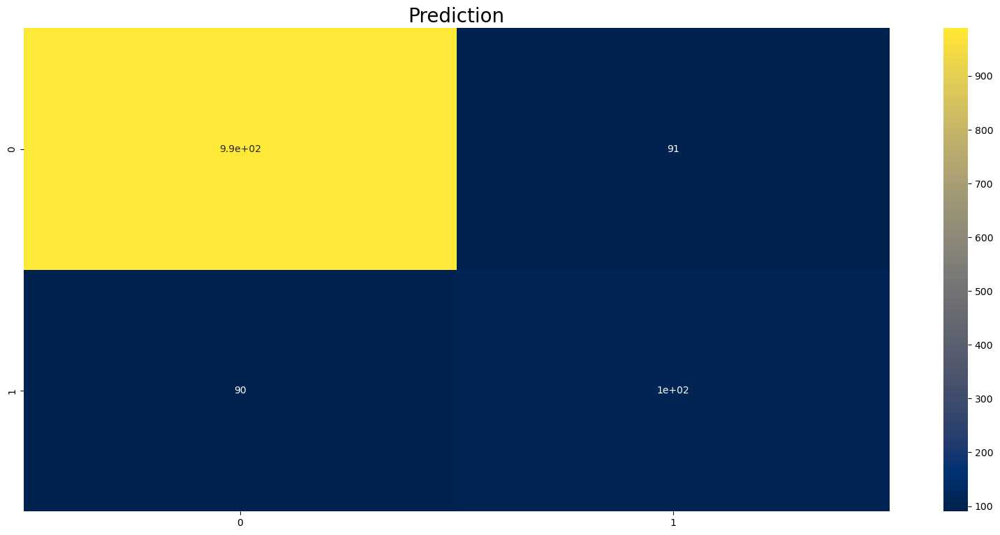

In [258]:
plt.figure(figsize = (20,9))
sns.heatmap(cm1, annot=True, cmap="cividis")
plt.title('Prediction', fontsize=20)

# -----------------------------------------------THE END---------------------------------------------------